### Import Packages

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.io import wavfile as wav
import pandas as pd
import numpy as np
from tqdm import tqdm
import os
from datetime import datetime 

import opendatasets as od

import IPython.display as ipd
import librosa
import librosa.display

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense,Dropout,Activation,Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder

### Importing Data

In [2]:
dataset_url = 'https://www.kaggle.com/chrisfilo/urbansound8k'
od.download(dataset_url,force=True)

Here we will first import one file 'small_dog_bark_IgU_UsS.wav' and see how the librosa library reads it and interprets it.

In [3]:
!dir

 Volume in drive C is Windows
 Volume Serial Number is EA55-D43A

 Directory of C:\Users\D100793\OneDrive - Citizens\Desktop\Krish Naik\Live Implementation Practice\Audio Classification

10/04/2021  10:38 PM    <DIR>          .
10/04/2021  10:38 PM    <DIR>          ..
10/04/2021  09:20 AM    <DIR>          .ipynb_checkpoints
10/04/2021  10:25 PM         8,207,646 415647__inspectorj__air-conditioner-on-off-a.wav
10/04/2021  10:25 PM         2,736,768 548355__tosha73__drilling-002.wav
10/04/2021  10:38 PM         1,388,852 Audio Classification.ipynb
10/04/2021  05:01 PM    <DIR>          saved_models
10/04/2021  01:49 PM           844,180 small_dog_bark_IgU_UsS.wav
10/04/2021  01:41 PM    <DIR>          UrbanSound8K
               4 File(s)     13,177,446 bytes
               5 Dir(s)  234,171,383,808 bytes free


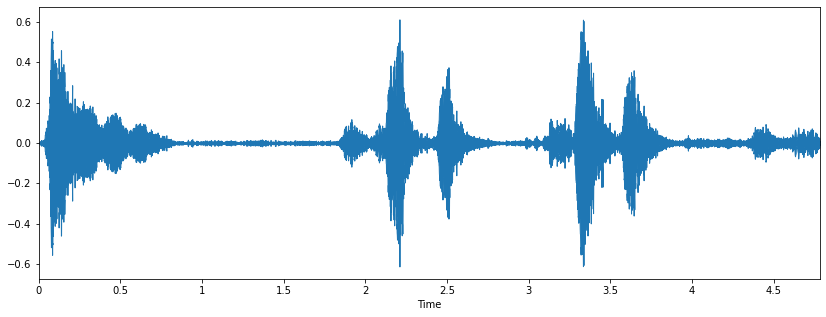

In [4]:
### Dog Sound
filename='small_dog_bark_IgU_UsS.wav'
data,sample_rate=librosa.load(filename)
plt.figure(figsize=(14,5))
librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

##### Sample Rate Definition

The sample rate sampling rate refers to the number of samples of audio recorded every second. It is measured in samples per second or Hertz (abbreviated as Hz or kHz, with one kHz being 1000 Hz). An audio sample is just a number representing the measured acoustic wave value at a specific point in time.

In [5]:
sample_rate

22050

In [6]:
wave_sample_rate, wave_audio=wav.read(filename)
wave_sample_rate

<ipython-input-6-6323306a4e57>:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  wave_sample_rate, wave_audio=wav.read(filename)


44100

In a sound wave audio, each and every signal can be represented by an integer value or a floating point value. This wav audio file below stores that value

In [7]:
wave_audio

array([[   0,    0],
       [   0,    0],
       [   0,    0],
       ...,
       [-122,  402],
       [-152,  317],
       [-136,  301]], dtype=int16)

Librosa normalizes the sound wave. so if we compare the value of 'wave_audio' and 'data' (coming from librosa) then we will notice 'data' has normalized value

In [8]:
data

array([ 3.4778761e-08, -3.8648138e-09, -3.8346734e-08, ...,
        6.0151257e-03,  4.0758434e-03,  0.0000000e+00], dtype=float32)

##### So librosa performs following step on the sound file
1) It converts all signals into Mono signal (even Stereo is converted into Mono)

2) Its represents audio signal points in a normalized pattern between -1 to +1.

##### Testing on another audio file to confirm

In [9]:
### Let's read a sample audio using librosa
audio_file_path='UrbanSound8K/fold5/100263-2-0-3.wav'
librosa_audio_data,librosa_sample_rate=librosa.load(audio_file_path)
print(librosa_audio_data)

[ 0.00330576  0.00468387  0.00360455 ... -0.0037562  -0.00348641
 -0.00356705]


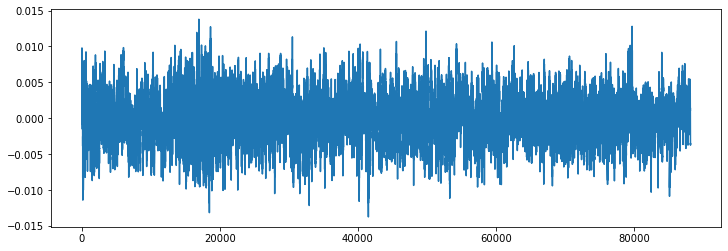

In [10]:
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio_data)

In [11]:
### Lets read with scipy
wave_sample_rate, wave_audio = wav.read(audio_file_path)
wave_audio

array([[ 194,  100],
       [ 179,  113],
       [ 160,  124],
       ...,
       [-143,  -87],
       [-134,  -91],
       [-110,  -98]], dtype=int16)

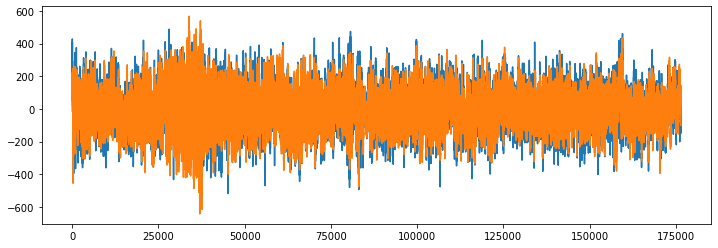

In [12]:
# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(wave_audio)

#### Observation
Here Librosa converts the signal to mono, meaning the channel will alays be 1

#### Importing Metadata of all video files

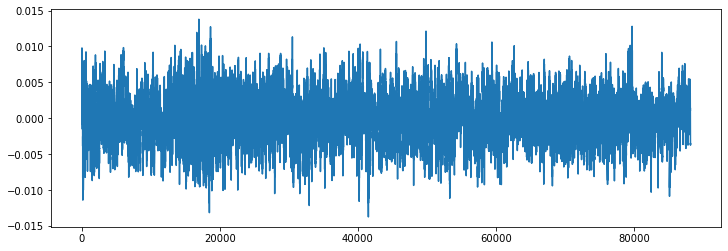

In [13]:
metadata=pd.read_csv('UrbanSound8K/UrbanSound8K.csv')
metadata.head(10)
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio_data)

### Data Preprocessing

##### Check whether the dataset is imbalanced

In [14]:
metadata['class'].value_counts()

dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

#### Extract Features

Here we will be using Mel-Frequency Cepstral Coefficients(MFCC) from the audio samples. The MFCC summarises the frequency distribution across the window size, so it is possible to analyse both the frequency and time characteristics of the sound. These audio representations will allow us to identify features for classification.

In [15]:
mfccs = librosa.feature.mfcc(y=librosa_audio_data, sr=librosa_sample_rate, n_mfcc=40)
print(mfccs.shape)

(40, 173)


In [16]:
mfccs

array([[-4.45197296e+02, -4.47219299e+02, -4.49755127e+02, ...,
        -4.77412781e+02, -4.74241730e+02, -4.82704987e+02],
       [ 1.12513969e+02,  1.11970390e+02,  1.12244164e+02, ...,
         1.12045395e+02,  1.12248581e+02,  1.05560913e+02],
       [-1.58260946e+01, -2.30021858e+01, -3.12500191e+01, ...,
        -9.15441704e+00, -1.03232288e+01, -7.39410877e+00],
       ...,
       [-7.82766533e+00, -5.03880358e+00, -4.48165369e+00, ...,
        -1.90692186e-01,  4.34143877e+00,  1.00339069e+01],
       [-1.91763771e+00, -8.02735090e-01, -1.20930576e+00, ...,
        -1.23642266e-01,  2.90548801e-02,  9.22014713e-01],
       [-3.88130307e-01,  3.09317946e-01,  6.72155571e+00, ...,
        -2.33736610e+00, -4.25180244e+00, -2.31322813e+00]], dtype=float32)

In [17]:
audio_dataset_path='UrbanSound8K/'

In [18]:
def features_extractor(file):
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
    return mfccs_scaled_features

##### Now we iterate through every audio file and extract features using Mel-Frequency Cepstral Coefficients

In [19]:
extracted_features=[]
for index_num,row in tqdm(metadata.iterrows()):
    file_name = os.path.join(os.path.abspath(audio_dataset_path),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
    final_class_labels=row["class"]
    data=features_extractor(file_name)
    extracted_features.append([data,final_class_labels])

3554it [02:15, 25.91it/s]C:\Users\D100793\AppData\Roaming\Python\Python38\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=2048 is too small for input signal of length=1323
  warnings.warn(
8326it [05:17, 33.67it/s]C:\Users\D100793\AppData\Roaming\Python\Python38\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=2048 is too small for input signal of length=1103
  warnings.warn(
C:\Users\D100793\AppData\Roaming\Python\Python38\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=2048 is too small for input signal of length=1523
  warnings.warn(
8732it [05:32, 26.25it/s]


#### Converting to pandas dataframe

In [20]:
extracted_features_df=pd.DataFrame(extracted_features,columns=['feature','class'])
extracted_features_df.head()

,feature,class
0,"[-215.79301, 71.66612, -131.81377, -52.091328,...",dog_bark
1,"[-424.68677, 110.56227, -54.148235, 62.01074, ...",children_playing
2,"[-459.56467, 122.800354, -47.92471, 53.265694,...",children_playing
3,"[-414.55377, 102.896904, -36.66495, 54.180405,...",children_playing
4,"[-447.397, 115.0954, -53.809113, 61.608585, 1....",children_playing


In [21]:
extracted_features_df.loc[0,'feature']

array([-2.1579301e+02,  7.1666122e+01, -1.3181377e+02, -5.2091328e+01,
       -2.2115967e+01, -2.1764179e+01, -1.1183746e+01,  1.8912683e+01,
        6.7266378e+00,  1.4556894e+01, -1.1782045e+01,  2.3010371e+00,
       -1.7251305e+01,  1.0052423e+01, -6.0094986e+00, -1.3153193e+00,
       -1.7693510e+01,  1.1171224e+00, -4.3699465e+00,  7.2629519e+00,
       -1.1815971e+01, -7.4952607e+00,  5.4577127e+00, -2.9442451e+00,
       -5.8693881e+00, -9.8653995e-02, -3.2121704e+00,  4.6092515e+00,
       -5.8293281e+00, -5.3475075e+00,  1.3341197e+00,  7.1307817e+00,
       -7.9450868e-02,  1.7109251e+00, -5.6942010e+00, -2.9041710e+00,
        3.0366952e+00, -1.6827594e+00, -8.8585865e-01,  3.5438946e-01],
      dtype=float32)

#### Split the dataset into independent and dependent dataset

In [22]:
X=np.array(extracted_features_df['feature'].tolist())
y=np.array(extracted_features_df['class'].tolist())

In [23]:
X.shape

(8732, 40)

In [24]:
y

array(['dog_bark', 'children_playing', 'children_playing', ...,
       'car_horn', 'car_horn', 'car_horn'], dtype='<U16')

In [25]:
X

array([[-2.15793015e+02,  7.16661224e+01, -1.31813766e+02, ...,
        -1.68275940e+00, -8.85858655e-01,  3.54389459e-01],
       [-4.24686768e+02,  1.10562271e+02, -5.41482353e+01, ...,
         6.17408693e-01, -6.84974074e-01,  5.71514547e-01],
       [-4.59564667e+02,  1.22800354e+02, -4.79247093e+01, ...,
         2.22541404e+00,  1.54661798e+00, -8.36315691e-01],
       ...,
       [-3.04613159e+02,  1.12619904e+02, -4.71619453e+01, ...,
        -3.03358078e+00,  2.71057296e+00,  7.67189503e+00],
       [-3.44714233e+02,  1.26758133e+02, -5.61771698e+01, ...,
        -7.80225849e+00, -1.77907360e+00,  5.83541918e+00],
       [-3.15933838e+02,  9.56758881e+01, -3.80477676e+01, ...,
         5.77580452e-01, -1.14637651e+01, -5.96535397e+00]], dtype=float32)

#### Label Encoding

In [26]:
labelencoder=LabelEncoder()
y=to_categorical(labelencoder.fit_transform(y))

In [27]:
y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]], dtype=float32)

### Model Creation

#### Train Test Split

In [28]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)

In [29]:
X_train

array([[-1.3183614e+02,  1.1397464e+02, -2.3956861e+01, ...,
         3.3314774e+00, -1.4786110e+00,  2.8736601e+00],
       [-1.4074219e+01,  9.1916939e+01, -8.6787224e+00, ...,
        -3.3844023e+00, -5.2119045e+00, -1.5936135e+00],
       [-4.9532028e+01,  1.5521857e-01, -2.0369110e+01, ...,
         2.0491767e+00, -8.0537474e-01,  2.7793026e+00],
       ...,
       [-4.2699332e+02,  9.2890656e+01,  3.0233388e+00, ...,
         8.6335993e-01,  6.4766794e-01,  7.8490514e-01],
       [-1.4607024e+02,  1.3709459e+02, -3.4298344e+01, ...,
         1.3777872e+00, -1.9530845e+00, -8.9652145e-01],
       [-4.2167450e+02,  2.1169032e+02,  2.6820309e+00, ...,
        -5.1484952e+00, -3.6400859e+00, -1.3321608e+00]], dtype=float32)

In [30]:

y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]], dtype=float32)

In [31]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(6985, 40)
(1747, 40)
(6985, 10)
(1747, 10)


In [32]:
num_labels=y.shape[1]
num_labels

10

#### ANN Model Configuration

In [33]:
model=Sequential()
###first layer
model.add(Dense(100,input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
###second layer
model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.5))
###third layer
model.add(Dense(100))
model.add(Activation('relu'))
model.add(Dropout(0.5))

###final layer
model.add(Dense(num_labels))
model.add(Activation('softmax'))

In [34]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 100)               4100      
_________________________________________________________________
activation (Activation)      (None, 100)               0         
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               20200     
_________________________________________________________________
activation_1 (Activation)    (None, 200)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 200)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               2

In [35]:
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

#### Trianing the model

In [36]:
num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath='saved_models/audio_classification.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

model_history = model.fit(X_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(X_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Epoch 1/100
219/219 [==============================] - 1s 2ms/step - loss: 10.4283 - accuracy: 0.1150 - val_loss: 2.2867 - val_accuracy: 0.1231

Epoch 00001: val_loss improved from inf to 2.28670, saving model to saved_models\audio_classification.hdf5
Epoch 2/100
219/219 [==============================] - 0s 1ms/step - loss: 2.5297 - accuracy: 0.1227 - val_loss: 2.2817 - val_accuracy: 0.1145

Epoch 00002: val_loss improved from 2.28670 to 2.28173, saving model to saved_models\audio_classification.hdf5
Epoch 3/100
219/219 [==============================] - 0s 1ms/step - loss: 2.3389 - accuracy: 0.1213 - val_loss: 2.2750 - val_accuracy: 0.1151

Epoch 00003: val_loss improved from 2.28173 to 2.27497, saving model to saved_models\audio_classification.hdf5
Epoch 4/100
219/219 [==============================] - 0s 1ms/step - loss: 2.2811 - accuracy: 0.1341 - val_loss: 2.2451 - val_accuracy: 0.1551

Epoch 00004: val_loss improved from 2.27497 to 2.24513, saving model to saved_models\audio_cla

219/219 [==============================] - 0s 1ms/step - loss: 1.2721 - accuracy: 0.5664 - val_loss: 1.0727 - val_accuracy: 0.6497

Epoch 00034: val_loss improved from 1.07542 to 1.07267, saving model to saved_models\audio_classification.hdf5
Epoch 35/100
219/219 [==============================] - 0s 1ms/step - loss: 1.2420 - accuracy: 0.5744 - val_loss: 1.0348 - val_accuracy: 0.6674

Epoch 00035: val_loss improved from 1.07267 to 1.03477, saving model to saved_models\audio_classification.hdf5
Epoch 36/100
219/219 [==============================] - 0s 1ms/step - loss: 1.2406 - accuracy: 0.5757 - val_loss: 1.0491 - val_accuracy: 0.6588

Epoch 00036: val_loss did not improve from 1.03477
Epoch 37/100
219/219 [==============================] - 0s 1ms/step - loss: 1.2392 - accuracy: 0.5781 - val_loss: 1.0149 - val_accuracy: 0.6674

Epoch 00037: val_loss improved from 1.03477 to 1.01485, saving model to saved_models\audio_classification.hdf5
Epoch 38/100
219/219 [===========================

219/219 [==============================] - 0s 1ms/step - loss: 1.0057 - accuracy: 0.6586 - val_loss: 0.8303 - val_accuracy: 0.7476

Epoch 00070: val_loss did not improve from 0.81496
Epoch 71/100
219/219 [==============================] - 0s 1ms/step - loss: 1.0310 - accuracy: 0.6494 - val_loss: 0.8066 - val_accuracy: 0.7447

Epoch 00071: val_loss improved from 0.81496 to 0.80657, saving model to saved_models\audio_classification.hdf5
Epoch 72/100
219/219 [==============================] - 0s 1ms/step - loss: 1.0164 - accuracy: 0.6603 - val_loss: 0.8182 - val_accuracy: 0.7516

Epoch 00072: val_loss did not improve from 0.80657
Epoch 73/100
219/219 [==============================] - 0s 1ms/step - loss: 1.0261 - accuracy: 0.6545 - val_loss: 0.8442 - val_accuracy: 0.7270

Epoch 00073: val_loss did not improve from 0.80657
Epoch 74/100
219/219 [==============================] - 0s 1ms/step - loss: 1.0270 - accuracy: 0.6581 - val_loss: 0.8204 - val_accuracy: 0.7418

Epoch 00074: val_loss di

In [37]:
test_accuracy=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy[1])

0.7601602673530579


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


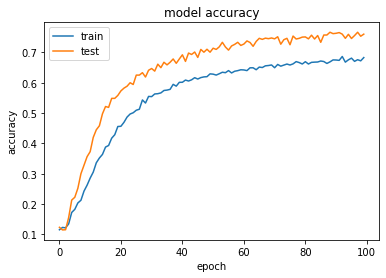

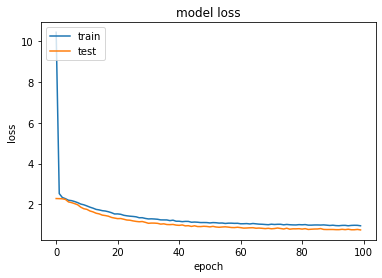

<function matplotlib.pyplot.clf()>

In [38]:
print(model_history.history.keys())
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
plt.clf

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
plt.clf

In [39]:

model.predict_classes(X_test)

C:\Users\D100793\AppData\Roaming\Python\Python38\site-packages\tensorflow\python\keras\engine\sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


array([5, 4, 4, ..., 1, 2, 5], dtype=int64)

### Testing Some Test Audio Data

Here we will be performing the following steps

1) Randomly download .wav audio data belonging to our classes from the internet.

2) Preprocess the new audio data

3) Predict the classes

##### Testing Dog barking audio data

[-3.21520294e+02  1.21411194e+02 -8.84741592e+00 -1.05715199e+01
 -1.15937257e+00 -1.45718992e+00 -1.67672672e+01  8.52653623e-01
 -4.04114580e+00  1.03806086e+01 -9.09241915e-01  1.46004114e+01
  7.47449219e-01  4.66216707e+00 -4.32373333e+00  7.60771036e-01
 -3.04138947e+00 -2.06370696e-01  4.15992165e+00  6.12755680e+00
  2.56132174e+00  2.80705667e+00  2.09120274e+00 -4.70771603e-02
  4.15566540e+00  3.85482478e+00  5.25933933e+00  1.12643182e+00
  2.01596546e+00  2.66456437e+00  3.29395980e-01  8.24151561e-03
  1.30759144e+00  2.99060535e+00 -4.37273622e-01 -3.93202543e-01
  2.38628481e-02  1.16934273e-02 -5.60982585e-01 -3.07397246e+00]
[[-3.21520294e+02  1.21411194e+02 -8.84741592e+00 -1.05715199e+01
  -1.15937257e+00 -1.45718992e+00 -1.67672672e+01  8.52653623e-01
  -4.04114580e+00  1.03806086e+01 -9.09241915e-01  1.46004114e+01
   7.47449219e-01  4.66216707e+00 -4.32373333e+00  7.60771036e-01
  -3.04138947e+00 -2.06370696e-01  4.15992165e+00  6.12755680e+00
   2.56132174e+00  

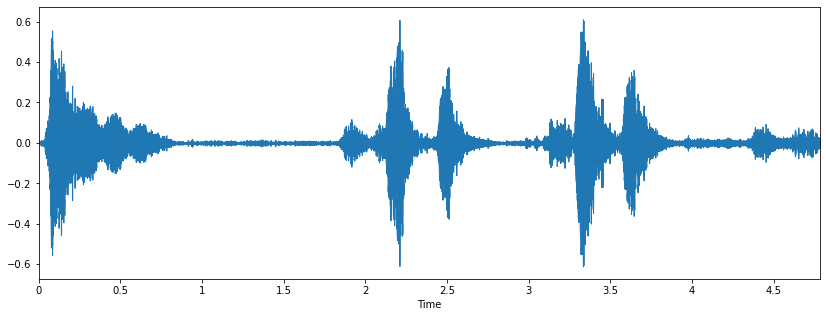

In [40]:
filename="small_dog_bark_IgU_UsS.wav"
audio, sample_rate = librosa.load(filename, res_type='kaiser_fast') 
mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)

print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)
print(mfccs_scaled_features.shape)
predicted_label=model.predict_classes(mfccs_scaled_features)
print(predicted_label)
prediction_class = labelencoder.inverse_transform(predicted_label) 
print('The class predicted is : {}'.format(prediction_class[0]))

plt.figure(figsize=(14,5))
librosa.display.waveplot(audio,sr=sample_rate)
ipd.Audio(filename)

The model correctly identified the audio file of dog bark

##### Testing Drilling audio data

[-1.3622186e+02  1.7607471e+01 -2.6846785e+01  2.3323462e+01
 -1.2851435e+01  1.3034511e+01 -2.6397963e+01  5.3697848e+00
 -2.1919739e+01  3.4650493e-01 -2.1559509e+01  4.8731089e+00
 -1.7111425e+01  1.9382509e+00 -1.7731825e+01 -3.5827186e+00
 -9.1743422e+00  1.5399952e+00 -9.1701107e+00 -1.2317013e+00
 -1.2158610e+01  9.3705565e-02 -1.0062207e+01  1.0284082e+00
 -7.0858350e+00 -2.4926229e+00 -9.3345413e+00 -4.4531360e+00
 -7.6585565e+00 -9.3485099e-01 -4.6122890e+00 -1.8377146e-02
 -4.2447634e+00  2.7525273e-01 -4.0873690e+00 -4.0814385e+00
 -6.1280642e+00 -3.5920601e+00 -6.5650053e+00 -2.6810496e+00]
[[-1.3622186e+02  1.7607471e+01 -2.6846785e+01  2.3323462e+01
  -1.2851435e+01  1.3034511e+01 -2.6397963e+01  5.3697848e+00
  -2.1919739e+01  3.4650493e-01 -2.1559509e+01  4.8731089e+00
  -1.7111425e+01  1.9382509e+00 -1.7731825e+01 -3.5827186e+00
  -9.1743422e+00  1.5399952e+00 -9.1701107e+00 -1.2317013e+00
  -1.2158610e+01  9.3705565e-02 -1.0062207e+01  1.0284082e+00
  -7.0858350e+00 

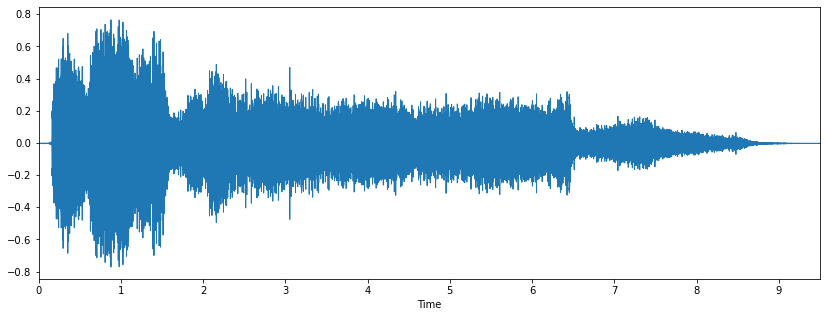

In [41]:
filename="548355__tosha73__drilling-002.wav"
audio, sample_rate = librosa.load(filename, res_type='kaiser_fast') 
mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)

print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)
print(mfccs_scaled_features.shape)
predicted_label=model.predict_classes(mfccs_scaled_features)
print(predicted_label)
prediction_class = labelencoder.inverse_transform(predicted_label) 
print('The class predicted is : {}'.format(prediction_class[0]))

plt.figure(figsize=(14,5))
librosa.display.waveplot(audio,sr=sample_rate)
ipd.Audio(filename)

The model correctly identified the audio file of drilling.

##### Testing Air Codnitioner audio data

[-290.54636    166.23042    -13.324583     2.8818111  -15.36728
   14.800356    -4.340478    -0.5917041    3.7416465    4.7633357
   -1.0871847    3.1062539   -2.789659     5.0457287    3.1637478
    4.992955     5.292671     5.254436     3.8062348    3.6605487
    5.436285     4.1177163    8.259232     5.4652247    7.2768717
    6.402725     5.7959356    2.2022083    3.1379702    2.6211603
    5.11942      5.4823337    4.377445     1.8843683    1.9990385
    2.6083143    2.7173798    3.9352193    2.0733232    0.9887593]
[[-290.54636    166.23042    -13.324583     2.8818111  -15.36728
    14.800356    -4.340478    -0.5917041    3.7416465    4.7633357
    -1.0871847    3.1062539   -2.789659     5.0457287    3.1637478
     4.992955     5.292671     5.254436     3.8062348    3.6605487
     5.436285     4.1177163    8.259232     5.4652247    7.2768717
     6.402725     5.7959356    2.2022083    3.1379702    2.6211603
     5.11942      5.4823337    4.377445     1.8843683    1.9990385
     2

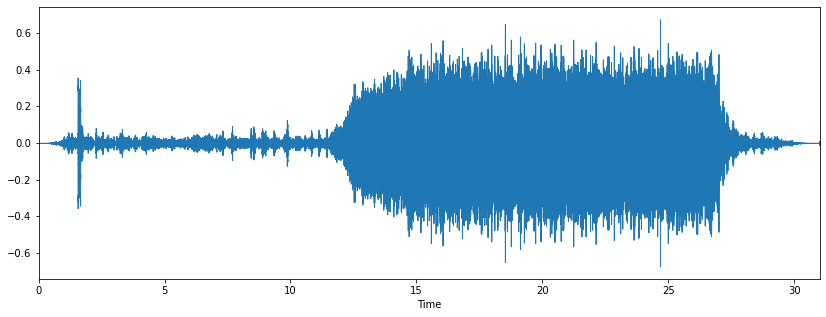

In [42]:
filename="415647__inspectorj__air-conditioner-on-off-a.wav"
audio, sample_rate = librosa.load(filename, res_type='kaiser_fast') 
mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)

print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)
print(mfccs_scaled_features.shape)
predicted_label=model.predict_classes(mfccs_scaled_features)
print(predicted_label)
prediction_class = labelencoder.inverse_transform(predicted_label) 
print('The class predicted is : {}'.format(prediction_class[0]))

plt.figure(figsize=(14,5))
librosa.display.waveplot(audio,sr=sample_rate)
ipd.Audio(filename)

Air Conditioner audio is wrongly classified as dog bark. This is becuase Model accuracy is 80% and it will wrongly classify 20% of time.